# Import modules and functions

In [1]:
import os
import subprocess
from owslib.wfs import WebFeatureService
import shapely.wkt
import geopandas as gpd
import json
from pathlib import Path
import urllib
import urllib.request
import gzip
import pandas as pd
import fiona  # Importing fiona to handle geospatial data
import sys
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.linear_model import LinearRegression
import seaborn as sns
from glob import glob  # Import glob for finding shapefiles
# Function to install a package
def install(package):
    subprocess.check_call([sys.executable, "-m", "pip", "install", package])

# Ensure required packages are installed
try:
    import tqdm
except ImportError as e:
    package = str(e).split()[-1]
    install(package)

import warnings
# Ignore FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

pd.set_option('display.max_columns', None)  # Show all columns of datasets

File Paths

In [2]:
# Define file paths for districts and tree canopy
district_shp_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\DISTRICTS_SHAPES"
tree_canopy_path = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Clipped_Tree_Data.shp"
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"


##Load study area and data

In [4]:
# Load the district shapefiles (if multiple files, adjust accordingly)
districts = gpd.read_file(district_shp_folder)
trees = gpd.read_file(tree_canopy_path)



In [5]:
# Find all shapefiles in the district folder
shapefiles = glob(os.path.join(district_shp_folder, "*.shp"))

In [6]:
# Load all district shapefiles into a list and concatenate them into one GeoDataFrame
districts_list = [gpd.read_file(shp) for shp in shapefiles]
districts = gpd.GeoDataFrame(pd.concat(districts_list, ignore_index=True))

In [7]:
# Check the columns to see if we have a unique identifier for each district
print(districts.columns)

Index(['Stadsdeel', 'Gebiedcode', 'Gebied', 'Stadsdeelc', 'Oppervlakt',
       'geometry'],
      dtype='object')


In [8]:
# Use 'Gebiedcode' as the unique identifier for districts
district_column = 'Gebiedcode'  # Adjust this to 'Gebied' if that's better

In [9]:
# Ensure both layers are in the same CRS (Coordinate Reference System)
districts = districts.to_crs(trees.crs)


In [10]:
# Perform the intersection to find the tree canopy within each district
intersected = gpd.overlay(districts, trees, how='intersection')

In [12]:
# Calculate the area of each district polygon
districts['district_area'] = districts.area

In [11]:
# Calculate the area of tree canopy polygons (from the intersection) within each district
intersected['canopy_area'] = intersected.area


In [13]:
# Group by the correct district identifier column ('Gebiedcode')
canopy_per_district = intersected.groupby(district_column)['canopy_area'].sum().reset_index()


In [14]:
# Merge the summed canopy area back into the original districts dataframe using 'Gebiedcode'
districts = districts.merge(canopy_per_district, on=district_column, how='left')

In [15]:
# Fill NaN values in canopy area with 0 (for districts with no canopy cover)
districts['canopy_area'] = districts['canopy_area'].fillna(0)


In [16]:
# Calculate the percentage of canopy cover per district
districts['canopy_cover_percentage'] = (districts['canopy_area'] / districts['district_area']) * 100


In [17]:
# Define the output path for the shapefile
output_shapefile_path = os.path.join(output_folder, "districts_with_canopy_cover.shp")


In [18]:
districts.explore(column='canopy_cover_percentage', 
                  cmap='Greens',  # Color map for the visualization
                  legend=True, 
                  tooltip=['Gebiedcode', 'canopy_cover_percentage'],  # Make sure column names match
                  popup=True)

In [19]:
districts.explore(
    column='canopy_cover_percentage', 
    cmap='Greens',  # Color map for the visualization
    legend=True, 
    tooltip=['Gebiedcode', 'canopy_cover_percentage'],  # Make sure column names match
    popup=True,
    tiles='CartoDB positron',  # Set the base map to a light grey theme
    style_kwds={
        'color': 'black',  # Set the district boundary color to black
        'weight': 1.5  # Set the line thickness (adjust as needed)
    }
)

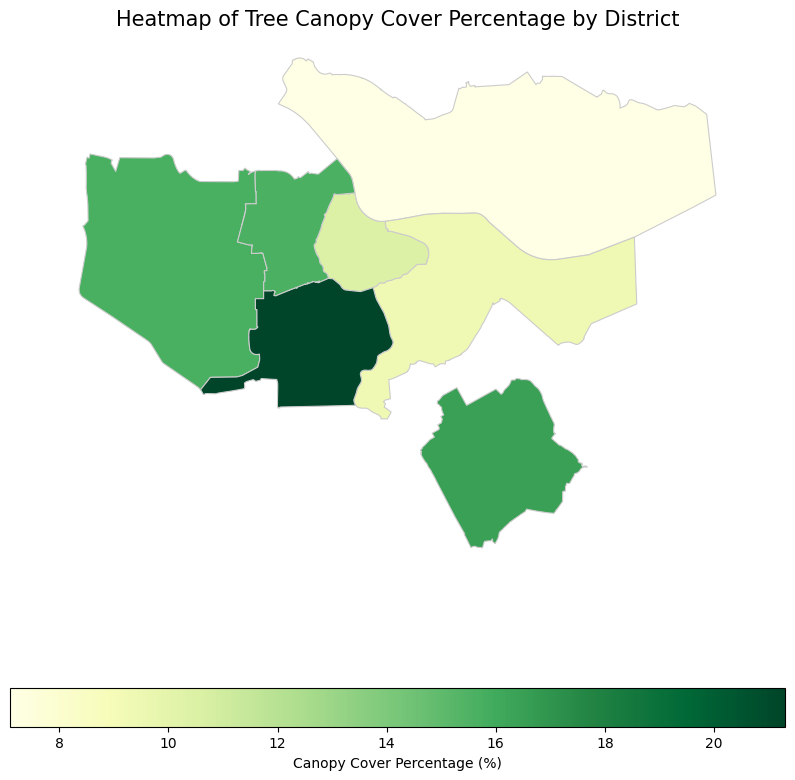

In [32]:
import matplotlib.pyplot as plt
import os

# Now, plot the heatmap using the canopy cover percentage
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Set the background color to grey
ax.set_facecolor('lightgrey')  # You can use 'darkgrey', '#D3D3D3', etc. for different shades of grey

# Plot the districts with canopy cover percentage
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # You can use 'hot', 'YlGnBu', or other heatmap color schemes
               linewidth=0.8, 
               ax=ax, 
               edgecolor='0.8',  # Set district boundary color
               legend=True,
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "horizontal"})

# Set plot title and labels
ax.set_title("Heatmap of Tree Canopy Cover Percentage by District", fontsize=15)
ax.set_axis_off()  # Turn off the axis

# Save the plot as a PNG file
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap.png")
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot if needed
plt.show()


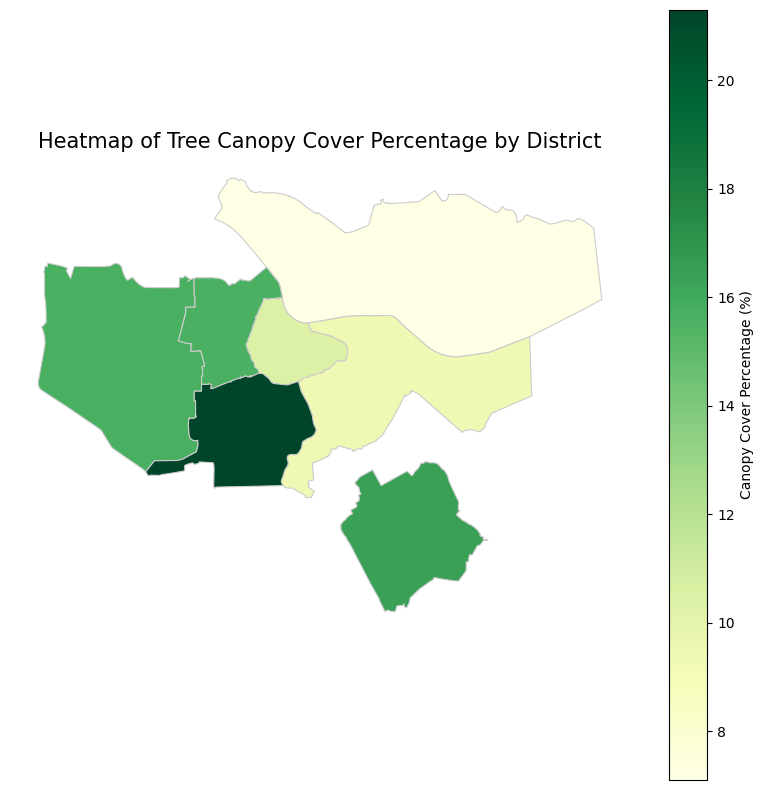

In [20]:
import geopandas as gpd
import matplotlib.pyplot as plt
import os

# Assuming you have already loaded your districts GeoDataFrame
# For example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Plot the heatmap using the canopy cover percentage
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Set the background color to grey
ax.set_facecolor('lightgrey')  # Change this to a different grey color if needed

# Plot the districts with the canopy cover percentage
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # You can use 'hot', 'YlGnBu', etc.
               linewidth=0.8, 
               ax=ax, 
               edgecolor='0.8',  # Set district boundary color to a lighter grey
               legend=True,
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical"})  # Adjust legend orientation as needed

# Set plot title and labels
ax.set_title("Heatmap of Tree Canopy Cover Percentage by District", fontsize=15)

# Turn off the axis if not needed
ax.set_axis_off()

# Define the output folder and file path to save the PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_grey_basemap.png")

# Save the plot as a high-resolution PNG file
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot if needed
plt.show()


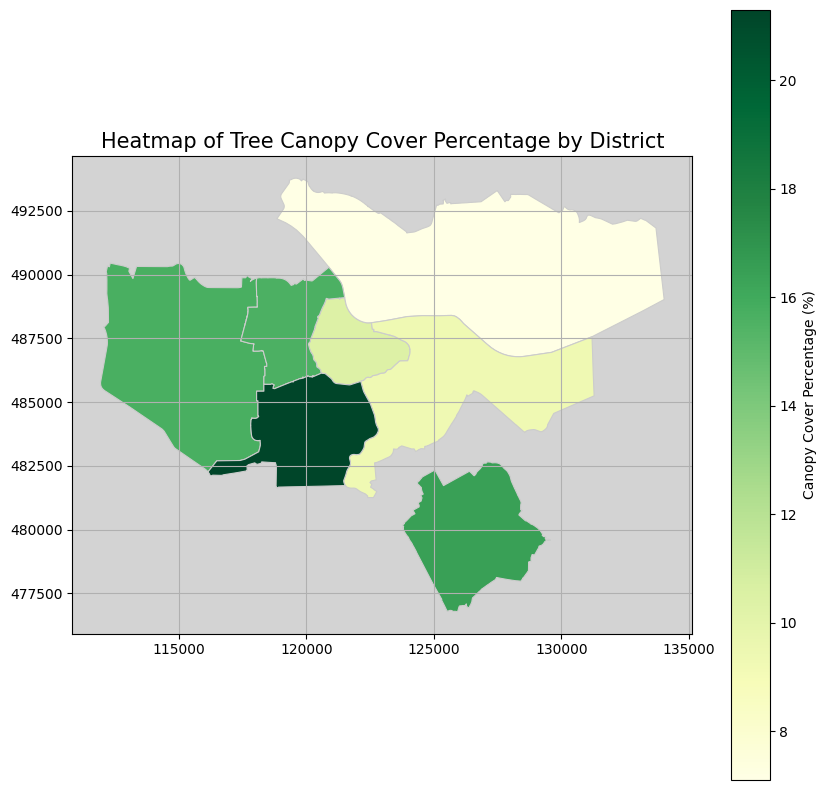

In [21]:
import geopandas as gpd
import matplotlib.pyplot as plt
import os

# Assuming you have already loaded your districts GeoDataFrame
# For example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Now, plot the heatmap using the canopy cover percentage
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Set the background color to grey
ax.set_facecolor('lightgrey')  # You can use 'darkgrey', '#D3D3D3', etc. for different shades of grey

# Plot the districts with canopy cover percentage
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # You can use 'hot', 'YlGnBu', or other heatmap color schemes
               linewidth=0.8, 
               ax=ax, 
               edgecolor='0.8',  # Set district boundary color
               legend=True,
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical"})  # Keep legend vertical like in the example

# Set plot title and labels
ax.set_title("Heatmap of Tree Canopy Cover Percentage by District", fontsize=15)

# Turn on grid for coordinates and set background color for map
ax.grid(True)  # Enable grid
ax.set_axis_on()  # Keep axis visible to show the coordinate grid

# Save the plot as a PNG file
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_grey_basemap_and_coords.png")

# Save the plot as a high-resolution PNG file
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot if needed
plt.show()



In [22]:
import folium
import geopandas as gpd
from folium import plugins
import os

# Assuming you have your 'districts' GeoDataFrame loaded

# Create a folium map with CartoDB positron as the basemap
m = folium.Map(location=[districts.geometry.centroid.y.mean(), districts.geometry.centroid.x.mean()],
               zoom_start=12, tiles='CartoDB positron')

# Add the districts with canopy cover percentage to the map
folium.Choropleth(
    geo_data=districts,
    name='choropleth',
    data=districts,
    columns=['Gebiedcode', 'canopy_cover_percentage'],
    key_on='feature.properties.Gebiedcode',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Canopy Cover Percentage (%)'
).add_to(m)

# Save the folium map as an HTML file
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
html_output_path = os.path.join(output_folder, "canopy_map_with_cartodb.html")
m.save(html_output_path)

print(f"Map saved as HTML at {html_output_path}")


Map saved as HTML at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_map_with_cartodb.html


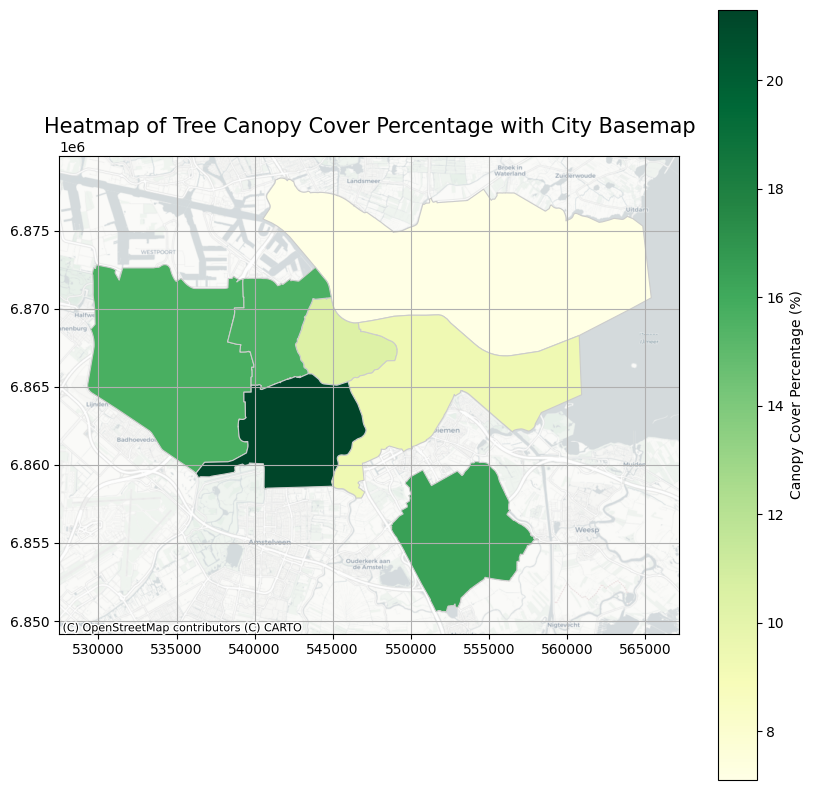

Heatmap with city basemap saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_cover_heatmap_with_city_basemap.png


In [23]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the districts with the canopy cover percentage
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # Choose a color scheme for the heatmap
               linewidth=0.8, 
               ax=ax, 
               edgecolor='0.8',  # Boundary color
               legend=True,
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical"})  # Legend orientation

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Heatmap of Tree Canopy Cover Percentage with City Basemap", fontsize=15)

# Turn on gridlines
ax.grid(True)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_city_basemap.png")
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

print(f"Heatmap with city basemap saved as PNG at {output_png_path}")


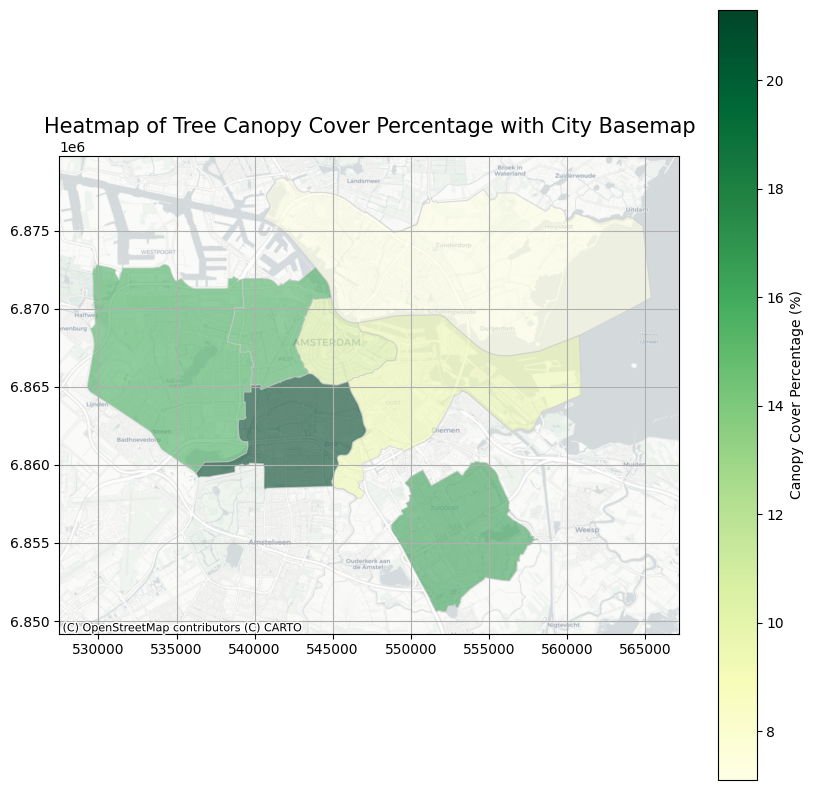

Heatmap with city basemap saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_cover_heatmap_with_city_basemap.png


In [24]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the districts with canopy cover percentage and add transparency with 'alpha'
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # Choose a color scheme for the heatmap
               linewidth=0.8, 
               ax=ax, 
               edgecolor='0.8',  # Boundary color
               legend=True,
               alpha=0.6,  # Adjust alpha for transparency
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical"})  # Legend orientation

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Heatmap of Tree Canopy Cover Percentage with City Basemap", fontsize=15)

# Turn on gridlines
ax.grid(True)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_city_basemap.png")
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

print(f"Heatmap with city basemap saved as PNG at {output_png_path}")


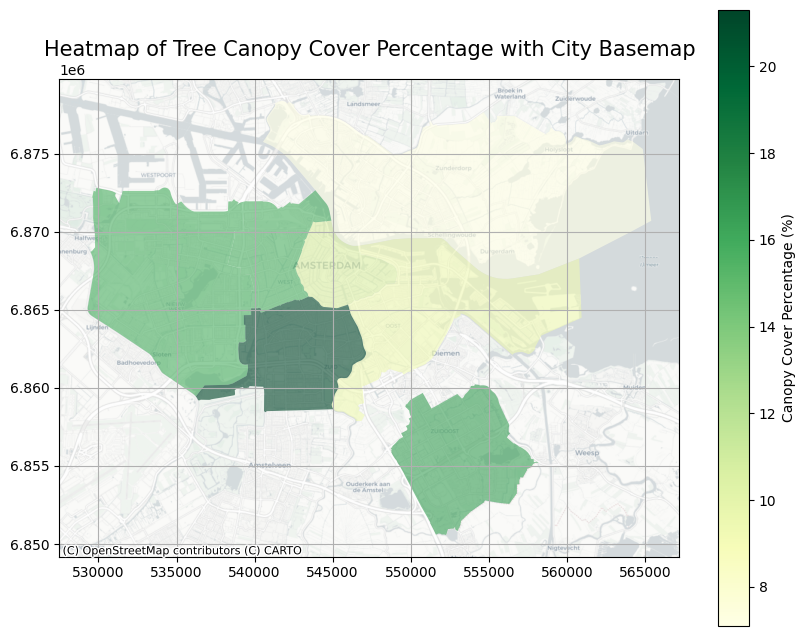

Heatmap with city basemap saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_cover_heatmap_with_city_basemap.png


In [25]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the districts with canopy cover percentage, remove boundaries, and add transparency
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # Choose a color scheme for the heatmap
               linewidth=0,  # Remove boundary lines
               ax=ax, 
               edgecolor=None,  # Ensure no edge color
               legend=True,
               alpha=0.6,  # Adjust alpha for transparency
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical",
                            'shrink': 0.8})  # Shrink the legend to match the map height

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Heatmap of Tree Canopy Cover Percentage with City Basemap", fontsize=15)

# Turn on gridlines
ax.grid(True)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_city_basemap.png")
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

print(f"Heatmap with city basemap saved as PNG at {output_png_path}")


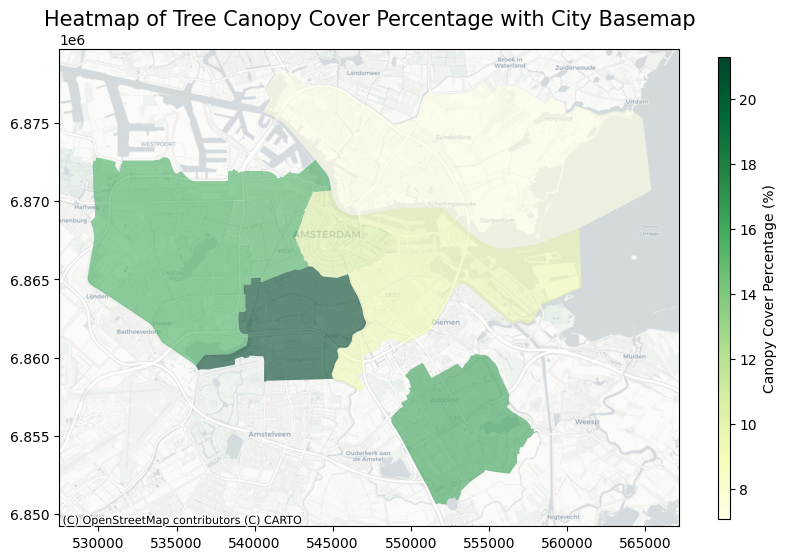

Heatmap with city basemap saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_cover_heatmap_with_city_basemap.png


In [26]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the districts with canopy cover percentage, remove boundaries, and add transparency
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # Choose a color scheme for the heatmap
               linewidth=0,  # Remove boundary lines
               ax=ax, 
               edgecolor=None,  # Ensure no edge color
               legend=True,
               alpha=0.6,  # Adjust alpha for transparency
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical",
                            'shrink': 0.6,  # Adjust the shrink to better match the height
                            'aspect': 40})  # Adjust the aspect ratio for vertical alignment

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Heatmap of Tree Canopy Cover Percentage with City Basemap", fontsize=15)

# Turn off the gridlines (reticule)
ax.grid(False)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_city_basemap.png")
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

print(f"Heatmap with city basemap saved as PNG at {output_png_path}")


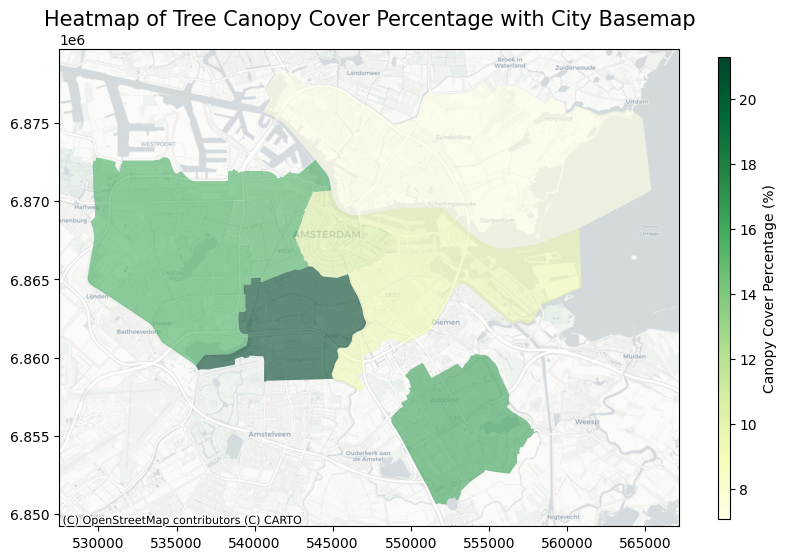

Heatmap with city basemap saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_cover_heatmap_with_city_basemap.png


In [28]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the districts with canopy cover percentage, remove boundaries, and add transparency
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # Choose a color scheme for the heatmap
               linewidth=0,  # Remove boundary lines
               ax=ax, 
               edgecolor=None,  # Ensure no edge color
               legend=True,
               alpha=0.6,  # Adjust alpha for transparency
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical",
                            'shrink': 0.6,  # Adjust the shrink to better match the height
                            'aspect': 40})  # Adjust the aspect ratio for vertical alignment

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Heatmap of Tree Canopy Cover Percentage with City Basemap", fontsize=15)

# Turn off the gridlines (reticule)
ax.grid(False)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_city_basemap.png")
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

print(f"Heatmap with city basemap saved as PNG at {output_png_path}")


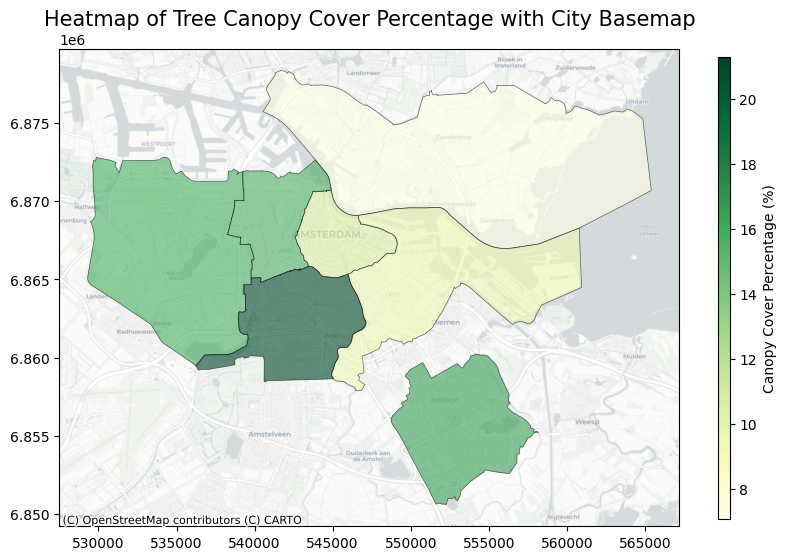

Heatmap with district boundaries and city basemap saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_cover_heatmap_with_district_boundaries.png


In [31]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the districts with canopy cover percentage, add boundaries, and add transparency
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # Choose a color scheme for the heatmap
               linewidth=0.5,  # Set the boundary line thickness
               ax=ax, 
               edgecolor='black',  # Set the boundary color to black or any visible color
               legend=True,
               alpha=0.6,  # Adjust alpha for transparency
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical",
                            'shrink': 0.6,  # Adjust the shrink to better match the height
                            'aspect': 40})  # Adjust the aspect ratio for vertical alignment

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Heatmap of Tree Canopy Cover Percentage with City Basemap", fontsize=15)

# Turn off the gridlines (reticule)
ax.grid(False)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_district_boundaries.png")
plt.savefig(output_png_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

print(f"Heatmap with district boundaries and city basemap saved as PNG at {output_png_path}")


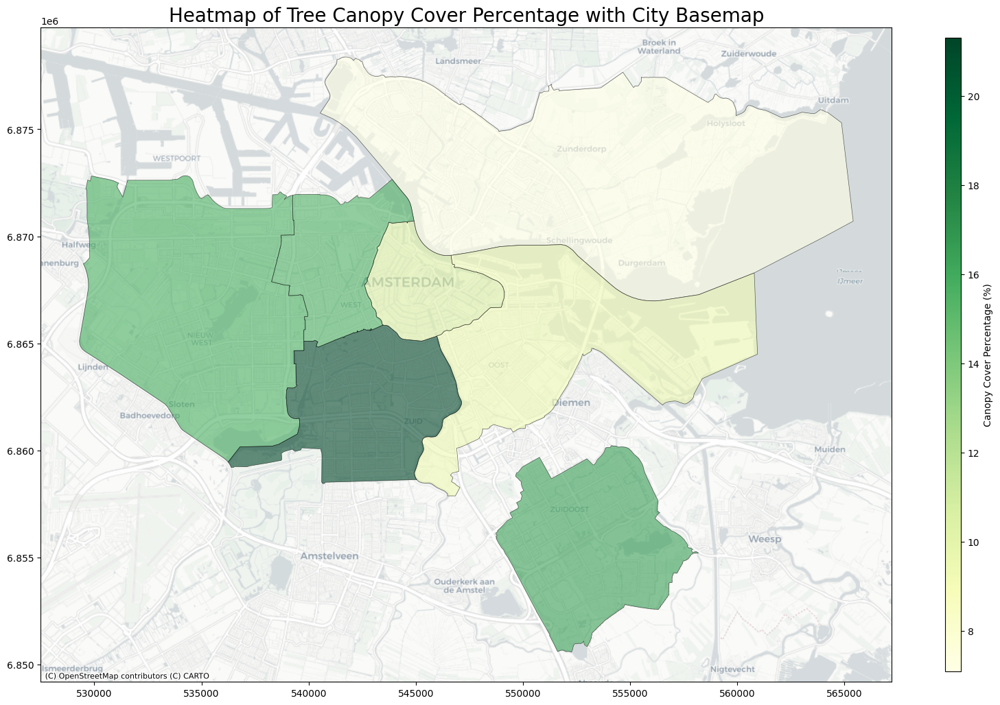

High-resolution heatmap with district boundaries and city basemap saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\canopy_cover_heatmap_with_district_boundaries_high_res.png


In [32]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot with a larger figsize
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Increased figure size

# Plot the districts with canopy cover percentage, add boundaries, and add transparency
districts.plot(column='canopy_cover_percentage', 
               cmap='YlGn',  # Choose a color scheme for the heatmap
               linewidth=0.5,  # Set the boundary line thickness
               ax=ax, 
               edgecolor='black',  # Set the boundary color to black or any visible color
               legend=True,
               alpha=0.6,  # Adjust alpha for transparency
               legend_kwds={'label': "Canopy Cover Percentage (%)",
                            'orientation': "vertical",
                            'shrink': 0.6,  # Adjust the shrink to better match the height
                            'aspect': 40})  # Adjust the aspect ratio for vertical alignment

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Heatmap of Tree Canopy Cover Percentage with City Basemap", fontsize=20)  # Larger title font size

# Turn off the gridlines (reticule)
ax.grid(False)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "canopy_cover_heatmap_with_district_boundaries_high_res.png")
plt.savefig(output_png_path, dpi=600, bbox_inches='tight')  # Increased dpi for higher resolution

# Show the plot
plt.show()

print(f"High-resolution heatmap with district boundaries and city basemap saved as PNG at {output_png_path}")



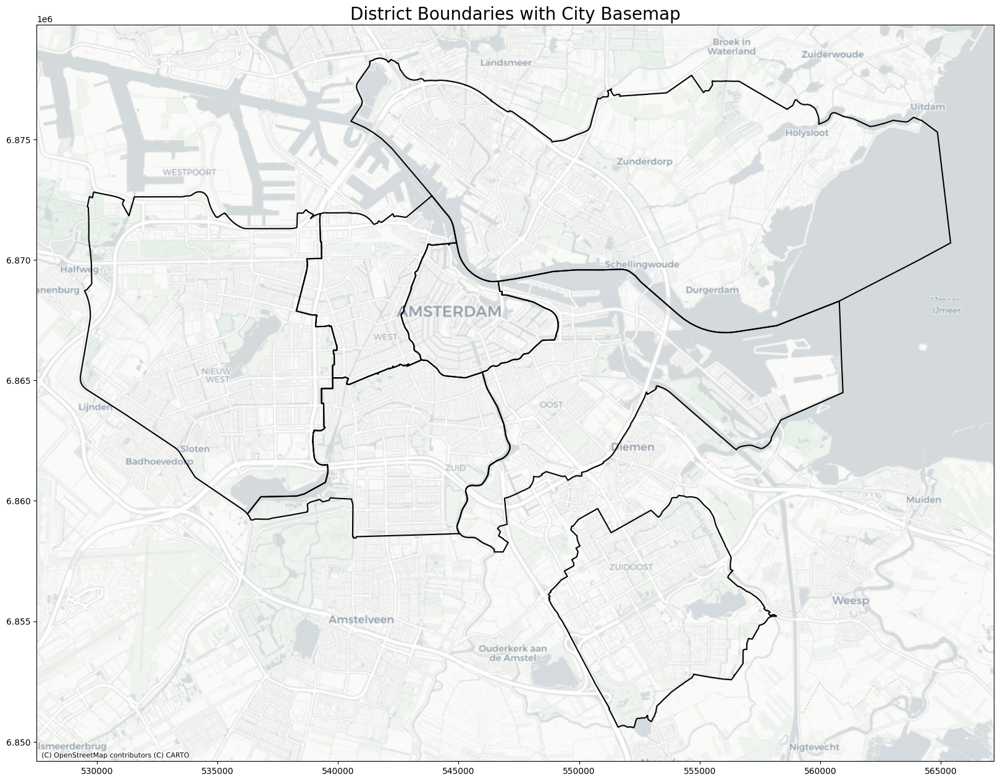

High-resolution district boundaries map saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\district_boundaries_high_res.png


In [33]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'districts' GeoDataFrame
# Example:
# districts = gpd.read_file('path_to_your_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
districts = districts.to_crs(epsg=3857)

# Create the plot for district boundaries only
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Increased figure size

# Plot the district boundaries without any additional layers
districts.boundary.plot(ax=ax, color='black', linewidth=1.5)  # Only district boundaries

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("District Boundaries with City Basemap", fontsize=20)  # Larger title font size

# Turn off the gridlines (reticule)
ax.grid(False)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "district_boundaries_high_res.png")
plt.savefig(output_png_path, dpi=600, bbox_inches='tight')  # Increased dpi for higher resolution

# Show the plot
plt.show()

print(f"High-resolution district boundaries map saved as PNG at {output_png_path}")


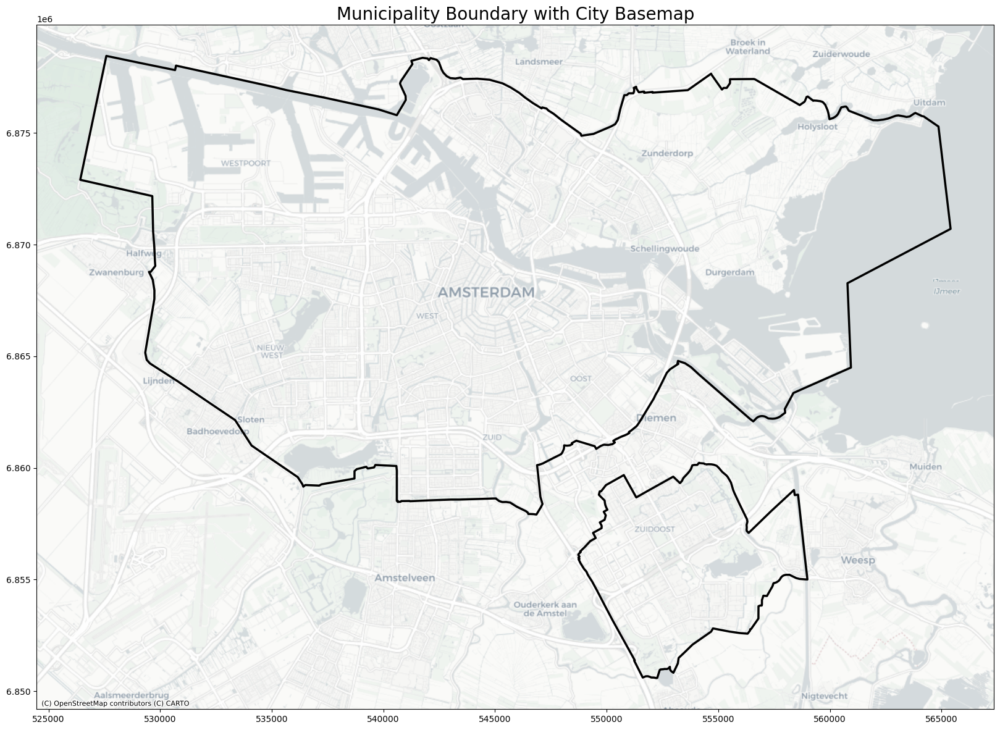

High-resolution municipality boundary map saved as PNG at C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district\municipality_boundary_high_res.png


In [36]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os

# Load your 'municipality_boundary' GeoDataFrame
# Example:
# municipality_boundary = gpd.read_file('path_to_your_municipality_shapefile.shp')

# Reproject the GeoDataFrame to web mercator (EPSG:3857) for compatibility with web map tiles
municipality_boundary = municipality_boundary.to_crs(epsg=3857)

# Create the plot for municipality boundary only
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Increased figure size

# Plot the municipality boundary
municipality_boundary.boundary.plot(ax=ax, color='black', linewidth=2.5)  # Set color and line thickness

# Add the CartoDB basemap using contextily
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

# Set the title for the plot
ax.set_title("Municipality Boundary with City Basemap", fontsize=20)  # Larger title font size

# Turn off the gridlines (reticule)
ax.grid(False)

# Save the plot as a high-resolution PNG
output_folder = r"C:\Users\daphn\Documents\MADE_THESIS\DATA\CLEAN_DATA\Canopy_per_district"
output_png_path = os.path.join(output_folder, "municipality_boundary_high_res.png")
plt.savefig(output_png_path, dpi=600, bbox_inches='tight')  # Increased dpi for higher resolution

# Show the plot
plt.show()

print(f"High-resolution municipality boundary map saved as PNG at {output_png_path}")
